In [1]:
import scanpy as sc, anndata as ad, numpy as np, pandas as pd
from scipy import sparse
from anndata import AnnData
import warnings
import socket
from matplotlib import pylab
import random
import sys
import yaml
import numbers
import os
import plotly.express as px
import matplotlib.pyplot as plt
import sklearn
import itertools
import seaborn as sns
import matplotlib.transforms as transforms


warnings.filterwarnings('ignore')

In [2]:
%matplotlib inline

In [3]:
sc.settings.verbosity = 3         # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=100, facecolor='white')
pylab.rcParams['figure.figsize'] = (10, 10)


scanpy==1.8.0 anndata==0.8.0 umap==0.4.6 numpy==1.22.2 scipy==1.6.2 pandas==1.2.3 scikit-learn==0.24.1 statsmodels==0.13.5 python-igraph==0.9.1 louvain==0.7.0 leidenalg==0.8.3


### Configure paths

In [4]:
outdir = "../data/output"

with open("../data/resources/iPSC_lines_map.yaml", 'r') as f:
    iPSC_lines_map = yaml.load(f, Loader=yaml.FullLoader)["lines"]
colorsmap = dict(zip([i["newName"] for i in iPSC_lines_map.values()],[i["color"] for i in iPSC_lines_map.values()]))


figDir = "./figures"
if not os.path.exists(figDir):
   # Create a new directory because it does not exist
   os.makedirs(figDir)
    

Namesmap = dict(zip([i["oldName"] for i in iPSC_lines_map.values()],[i["newName"] for i in iPSC_lines_map.values()]))


In [5]:
colorsmap['singlet'] = 'blue'
colorsmap['doublet'] = 'orange'

In [6]:
SoftwareColorsDict = {'Demuxlet':"tab:blue", 
                      'SCanSNP':"tab:orange", 
                      'SoC':"tab:green", 
                      'Vireo':"tab:red",
                      "Consensus":"tab:cyan",
                     "Expected":"black",
                     "AVG_Overlap":"purple"}


SoftwareList = ["Demuxlet","Vireo","SoC","SCanSNP"]

DatasetMarkersDict = {
"D50Up" : "v",
"D50Down" : "o",
"D100Up_1" : "s",
"D100Up_2" : "p",
"D250Down" : "D",
"D100Down" : "X",
"D300Up" : "^"
}


IDsMarkersDict = {
'CTL01': 'o',
 'CTL04E': 'o',
 'CTL02A': 'o',
 'CTL08A': 'o',
 'WVS04A': 'o',
 'WVS02A': 'o',
 'WVS03B': 'o',
 'CTL09A': 'o',
 'WVS01': 'o',
 'CFG': 'o',
 'doublet': 'o',
 'singlet': 'o',
 'LowQuality': 'o',
 'GoodQuality': 'o',
 'unassigned': 'o',
'Overall_agreement': '+'    
}



DatasetColorDict = {
"D50Up" : "mediumspringgreen",
"D50Down" : "salmon",
"D100Up_1" : "darkcyan",
"D100Up_2" : "blueviolet",
"D250Down" : "lightslategrey",
"D100Down" : "black",
"D300Up" : "red"
}

In [7]:
SynthDictPaths = {
    "SYNTH1":"../data/synthMultiplexed/SYNTH1",
    "SYNTH2":"../data/synthMultiplexed/SYNTH2",
    "SYNTH3":"../data/synthMultiplexed/SYNTH3",
    "SYNTH4":"../data/synthMultiplexed/SYNTH4",
    "SYNTH5":"../data/synthMultiplexed/SYNTH5" ,
}

SynthNameMaps = {
    "CFG":"Sample_S20568_CFGSH52D18",
    "809":"809_1_5",
    "KOLF":"KOLF2C1DAY100REP1",
    "3391B":"3391BDAY100REP1",
    "MIFF1":"MIFF1DAY100REP1" ,
}

In [8]:
adata_path_dict = {
"D50Up" : "../data/Sample_S20272_157/filtered_feature_bc_matrix",
"D50Down" : "../data/Sample_S20273_158/filtered_feature_bc_matrix",
"D100Up_1" : "../data/Sample_S20812_258/filtered_feature_bc_matrix",
"D100Up_2" : "../data/Sample_S20813_259/filtered_feature_bc_matrix",
"D250Down" : "../data/Sample_S20814_260/filtered_feature_bc_matrix",
"D100Down" : "../data/Sample_S31807_MET6/filtered_feature_bc_matrix",
"D300Up" : "../data/Sample_S33846_C_GEX/filtered_feature_bc_matrix"
}

adata_dict =    {}

In [9]:
DatasetBasedirs = {
"D50Up" : "../data/Sample_S20272_157/",
"D50Down" : "../data/Sample_S20273_158/",
"D100Up_1" : "../data/Sample_S20812_258/",
"D100Up_2" : "../data/Sample_S20813_259/",
"D250Down" : "../data/Sample_S20814_260/",
"D100Down" : "../data/Sample_S31807_MET6/",
"D300Up" : "../data/Sample_S33846_C_GEX/"
}



In [10]:
FractionDF = pd.DataFrame()
CombinedCallsDF = pd.DataFrame()

for ds in list(DatasetBasedirs.keys()):
    aggregatedCall = pd.read_csv(DatasetBasedirs[ds]+"/aggregatedCall/aggregatedCall.tsv", sep = "\t")
    aggregatedCall.index = aggregatedCall["barcode"].tolist()
    del aggregatedCall["barcode"]

    DemuxCall = pd.read_csv(DatasetBasedirs[ds]+"/demuxlet_v2/"+DatasetBasedirs[ds].split("/")[-2]+".best", sep = "\t", index_col=1)[["DROPLET.TYPE","SNG.BEST.GUESS"]].replace({"SNG":"singlet","DBL":"doublet","AMB":"Unassigned"})
    DemuxCall = pd.DataFrame(np.where(DemuxCall["DROPLET.TYPE"] == "singlet", DemuxCall["SNG.BEST.GUESS"],DemuxCall["DROPLET.TYPE"]), index = DemuxCall.index.tolist()).replace(Namesmap)

    SCanSNPCall = pd.read_csv(DatasetBasedirs[ds]+"/scansnp/Cell_IDs.tsv", sep = "\t", index_col=0)[["Quality","ID"]].replace({"Doublet":"doublet"})
    SCanSNPCall = pd.DataFrame(np.where(SCanSNPCall["Quality"] == "GoodQuality", SCanSNPCall["ID"],SCanSNPCall["Quality"]), index = SCanSNPCall.index.tolist()).replace(Namesmap)

    SoCCall = pd.read_csv(DatasetBasedirs[ds]+"/souporcell/clusters.tsv", sep = "\t", index_col=0)[["status","assignment"]].replace({"singlet":"singlet","doublet":"doublet","unassigned":"Unassigned"}).replace(Namesmap)
    SoCCall = pd.DataFrame(np.where(SoCCall["status"] == "singlet", SoCCall["assignment"],SoCCall["status"]), index = SoCCall.index.tolist())
    VireoCall = pd.read_csv(DatasetBasedirs[ds]+"/vireo/vireo_out/donor_ids.tsv", sep = "\t", index_col=0)["donor_id"].replace({"singlet":"singlet","doublet":"doublet","unassigned":"Unassigned"}).replace(Namesmap)

    Consensus = pd.read_csv(DatasetBasedirs[ds]+"aggregatedCall/aggregatedCall.tsv", sep = "\t", index_col=0).replace({"doublet":"doublet"}).replace(Namesmap)

    combined = pd.concat([DemuxCall,SCanSNPCall,SoCCall,VireoCall,Consensus], axis = 1)
    combined.columns = ["Demuxlet","SCanSNP","SoC","Vireo","Consensus"]
    combined.index = [i+"_"+ds for i in combined.index.tolist()]
    combined["dataset"] = ds
    Total = combined.shape[0]
    combined['total'] = Total
    CombinedCallsDF = pd.concat([CombinedCallsDF,combined])
    
    #Fraction of calls
    combinedFraction = combined.drop(columns=['dataset']).apply(pd.Series.value_counts).T.fillna(0)
    combinedFraction = combinedFraction.divide(Total, axis = 0)
    combinedFraction["Software"] = combinedFraction.index.tolist()
    combinedFraction = combinedFraction.melt("Software")
    combinedFraction['dataset'] = ds
    combinedFraction['total'] = Total
    FractionDF = pd.concat([FractionDF,combinedFraction], ignore_index=True)


    #Map soc clusters to best matching ids

#Add fake call which corresponds to expected rate
Expected = FractionDF[["dataset","total"]].drop_duplicates()
Expected["value"] = (Expected["total"]/1000*.8)/100
Expected["Software"] = "Expected"
Expected["variable"] = "doublet"
FractionDF = pd.concat([FractionDF,Expected], ignore_index=True)


# Fraction plots across datasets

## With SCanSNP and Consensus

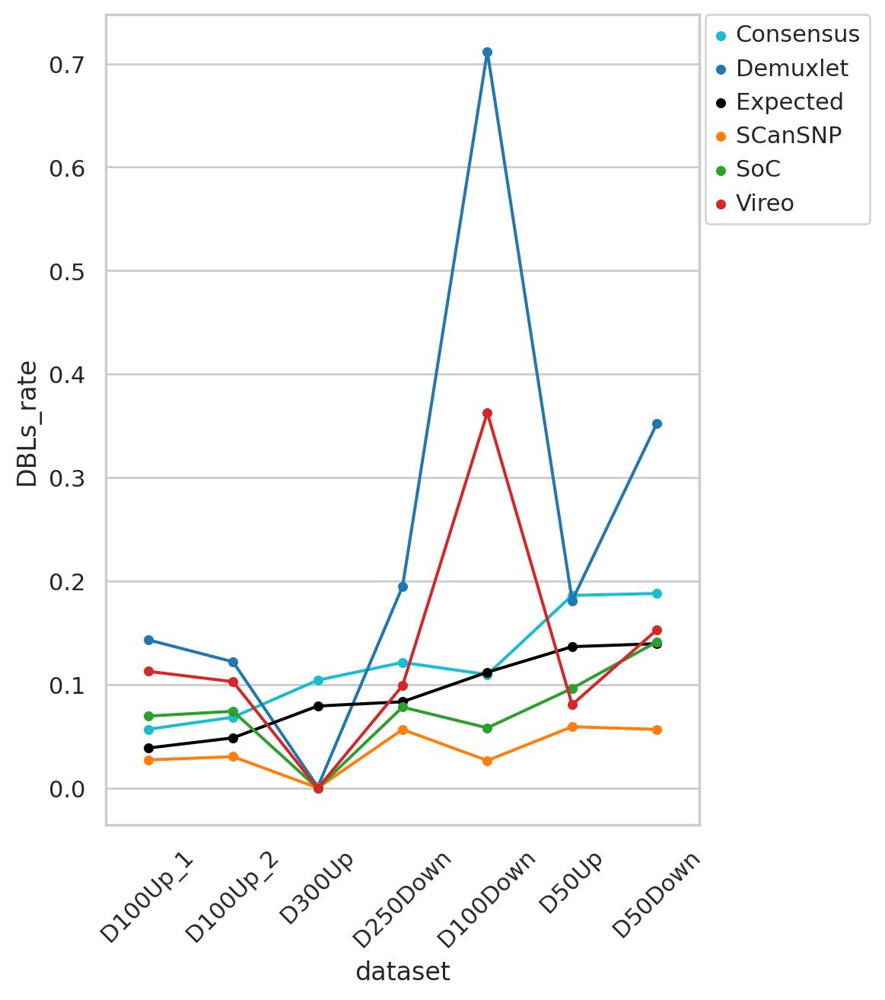

<Figure size 500x700 with 0 Axes>

In [11]:
sList = ["Demuxlet","SoC","Vireo","SCanSNP","Consensus","Expected"]
from matplotlib.pyplot import figure
sns.set_style("whitegrid")
DSOrder = FractionDF.groupby("dataset")["total"].min().sort_values().index.tolist()
pylab.rcParams['figure.figsize'] = (5, 7)


DFperType = FractionDF[(FractionDF.variable == "doublet") & (FractionDF.Software.isin(sList))]
DFperType["Software"] = DFperType.Software.astype("category")
DFperType.columns=['Software', 'variable', 'DBLs_rate', 'dataset', 'total']

#figure( dpi=200)

#sns.barplot(x="dataset", y="TotalNorm", data=totalNorm, order=DSOrder,facecolor=(1, 1, 1, 0) ,edgecolor="grey").set(title=dType+"s rate per dataset (ordered by total recovered cells)")

sns.set(rc={"lines.linewidth": 0.8})
sns.set_style("whitegrid")

g=sns.pointplot(data=DFperType, hue = "Software",x="dataset",
                order=DSOrder,palette=SoftwareColorsDict,
                y="DBLs_rate",height=1, 
                 aspect=4,linewidth=.2)

plt.legend(bbox_to_anchor=(1.01, 1), loc=2, borderaxespad=0.)
plt.xticks(rotation=45)


#g.plot()
#g.fig.text(x=0.5, y=1, s=dType, fontsize=20, ha="center", transform=g.fig.transFigure)
plt.figure()

fig = g.get_figure()
fig.savefig(figDir+"/DBLRate.svg",dpi=300, bbox_inches = "tight")


    #sns.barplot(x="Total", y="dataset", data=DFperType[["dataset","Total"]])
    #g.map(plt.scatter, s=DFperType["Total"])

## Without SCanSNP and Consensus

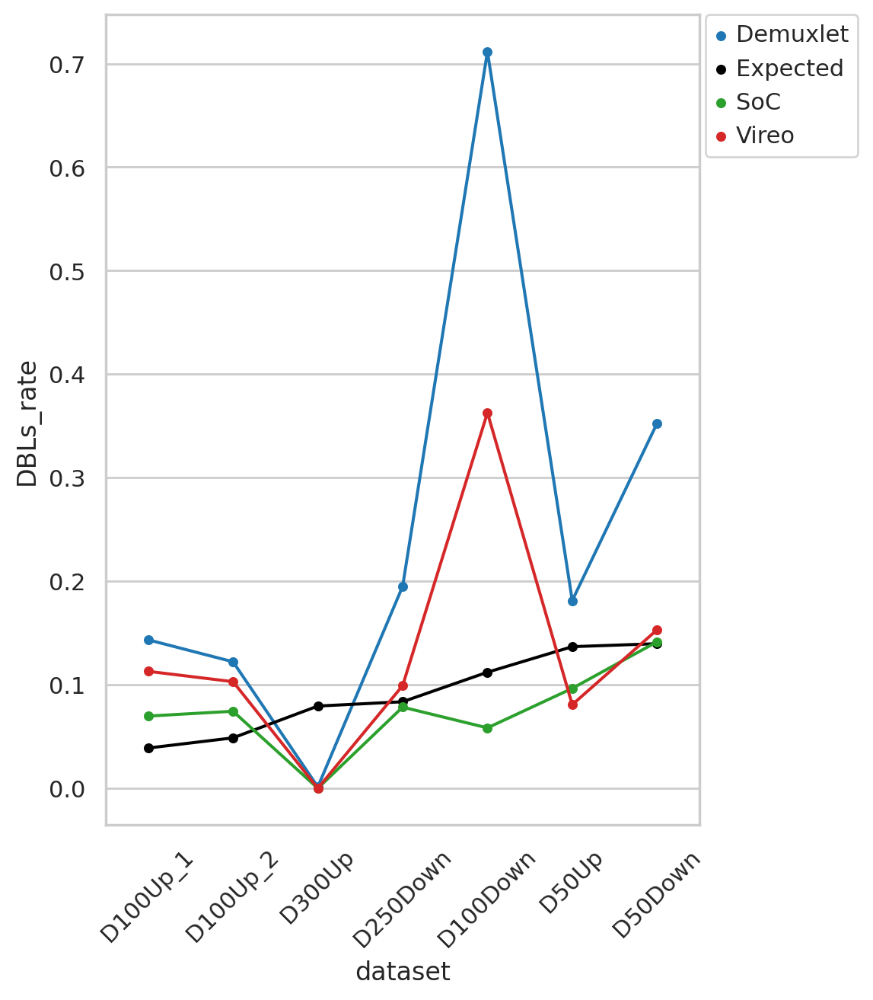

<Figure size 500x700 with 0 Axes>

In [12]:
sList = ["Demuxlet","SoC","Vireo","Expected"]
from matplotlib.pyplot import figure
sns.set_style("whitegrid")
DSOrder = FractionDF.groupby("dataset")["total"].min().sort_values().index.tolist()
pylab.rcParams['figure.figsize'] = (5, 7)


DFperType = FractionDF[(FractionDF.variable == "doublet") & (FractionDF.Software.isin(sList))]
DFperType["Software"] = DFperType.Software.astype("category")
DFperType.columns=['Software', 'variable', 'DBLs_rate', 'dataset', 'total']

#figure( dpi=200)

#sns.barplot(x="dataset", y="TotalNorm", data=totalNorm, order=DSOrder,facecolor=(1, 1, 1, 0) ,edgecolor="grey").set(title=dType+"s rate per dataset (ordered by total recovered cells)")

sns.set(rc={"lines.linewidth": 0.8})
sns.set_style("whitegrid")

g=sns.pointplot(data=DFperType, hue = "Software",x="dataset",
                order=DSOrder,palette=SoftwareColorsDict,
                y="DBLs_rate",height=1, 
                 aspect=4,linewidth=.2)

plt.legend(bbox_to_anchor=(1.01, 1), loc=2, borderaxespad=0.)
plt.xticks(rotation=45)


#g.plot()
#g.fig.text(x=0.5, y=1, s=dType, fontsize=20, ha="center", transform=g.fig.transFigure)
plt.figure()

fig = g.get_figure()
fig.savefig(figDir+"/DBLRateNOSCANSNP.svg",dpi=300, bbox_inches = "tight")



    #sns.barplot(x="Total", y="dataset", data=DFperType[["dataset","Total"]])
    #g.map(plt.scatter, s=DFperType["Total"])

# Counts inspection

In [13]:
for ds in list(DatasetBasedirs.keys()):
    adata_dict[ds] = sc.read_10x_mtx(adata_path_dict[ds],
        var_names='gene_symbols',                # use gene symbols for the variable names (variables-axis index)
        cache=True)
    adata_dict[ds].obs_names = [i+"_"+ds for i in adata_dict[ds].obs_names.tolist()]
    sc.pp.calculate_qc_metrics(adata_dict[ds], inplace=True)
adata = ad.concat(list(adata_dict.values()))


... reading from cache file cache/..-data-Sample_S20272_157-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/..-data-Sample_S20273_158-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/..-data-Sample_S20812_258-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/..-data-Sample_S20813_259-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/..-data-Sample_S20814_260-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/..-data-Sample_S31807_MET6-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/..-data-Sample_S33846_C_GEX-filtered_feature_bc_matrix-matrix.h5ad


In [14]:
adata.obs = pd.concat([adata.obs,CombinedCallsDF], axis = 1)
CombinedCallsDF.loc[adata.obs_names,"total_counts"] = adata.obs["total_counts"]

In [15]:
SoftwareList+["Consensus"]

['Demuxlet', 'Vireo', 'SoC', 'SCanSNP', 'Consensus']

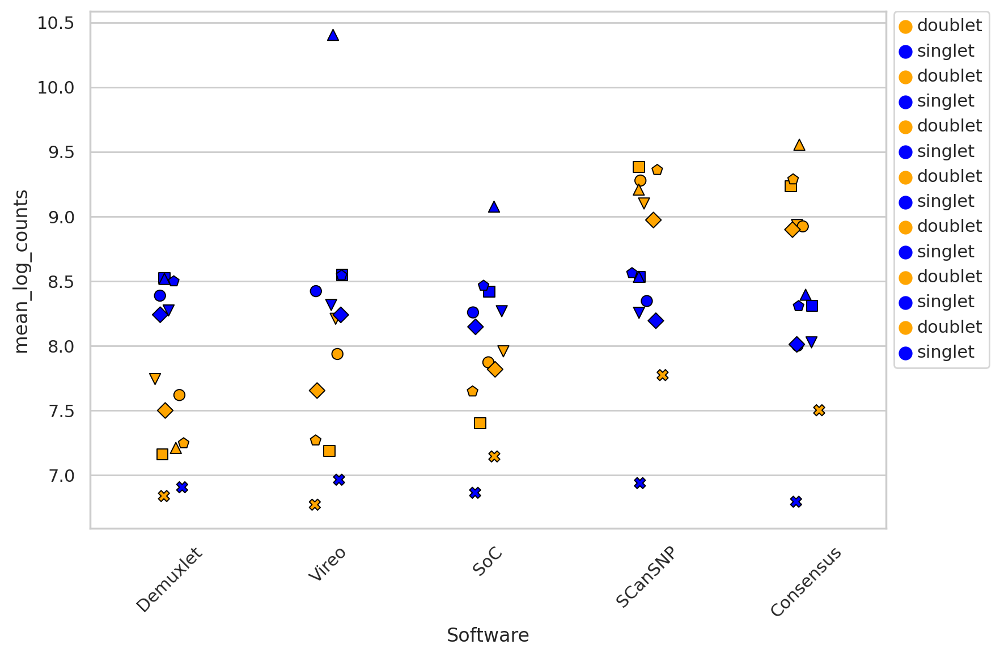

In [16]:
dsDict = {}
pylab.rcParams['figure.figsize'] = (9, 6)
sns.set_style("whitegrid")

dictemp = {}

for ds in CombinedCallsDF.dataset.unique():
    localDF = CombinedCallsDF[CombinedCallsDF.dataset == ds]
    for s in SoftwareList+["Consensus"]:
        localDF2 = localDF.loc[:,[s,"total_counts"]]
        localDF2["Software"] = s
        localDF2["log_counts"] = np.log1p(localDF2["total_counts"])
        localDF2.columns = ["ID","total_counts","Software","log_counts"]
        localDF2["ID"] = np.where(~localDF2["ID"].isin(["Unassigned","LowQuality","doublet"]), "singlet",localDF2["ID"])
        #Keep only singlets and doublets
        localDF2 = localDF2[localDF2["ID"].isin(["singlet","doublet"])]
        localDF2 = localDF2.groupby(["ID"], as_index=False)["log_counts"].mean()
        localDF2["Software"] = s
        localDF2["dataset"] = ds
        localDF2.columns = ['ID', 'mean_log_counts', 'Software', 'dataset']
        
        dsDict[s] =  localDF2.copy()
        dictemp[s+'_'+ds] = localDF2.copy()
        
    
    PlotDF = pd.concat(list(dsDict.values()))
    #g=sns.scatterplot(x="Software", y="log_counts", hue="ID",palette="Set2",hue_order=["singlet","doublet"],markers=DatasetMarkersDict[ds],style="dataset",
    #                data=PlotDF)
    g=sns.stripplot(x="Software", y="mean_log_counts", hue="ID",marker=DatasetMarkersDict[ds],data=PlotDF, palette=colorsmap,
                    jitter=True, edgecolor="black",linewidth=.7, size=7, order=SoftwareList+["Consensus"])
    #plt.legend(bbox_to_anchor=(1.01, 1), loc=2, borderaxespad=0.)
    plt.xticks(rotation=45)
    g.get_legend().remove()

    plt.legend(bbox_to_anchor=(1.01, 1), loc=2, borderaxespad=0.)
    fig = g.get_figure()
    fig.savefig(figDir+"/DBLmedianCounts.svg",dpi=300, bbox_inches = "tight")


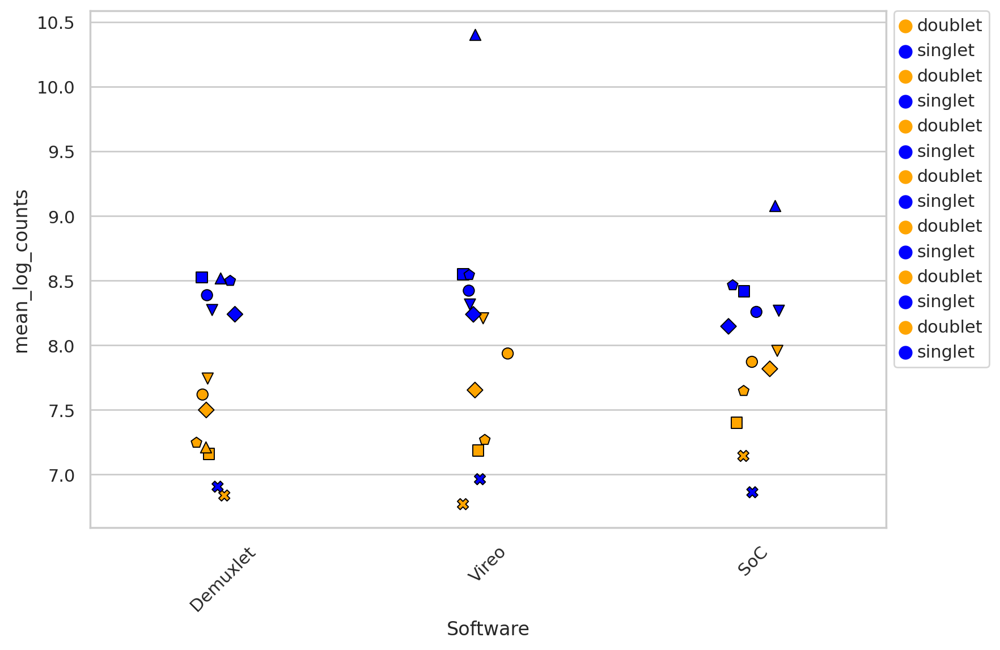

In [17]:
dsDict = {}
pylab.rcParams['figure.figsize'] = (9, 6)
sns.set_style("whitegrid")
dictemp = {}


for ds in CombinedCallsDF.dataset.unique():
    localDF = CombinedCallsDF[CombinedCallsDF.dataset == ds]
    for s in list(set(SoftwareList).difference(set(['SCanSNP']))):
        localDF2 = localDF.loc[:,[s,"total_counts"]]
        localDF2["Software"] = s
        localDF2["log_counts"] = np.log1p(localDF2["total_counts"])
        localDF2.columns = ["ID","total_counts","Software","log_counts"]
        localDF2["ID"] = np.where(~localDF2["ID"].isin(["Unassigned","LowQuality","doublet"]), "singlet",localDF2["ID"])
        #Keep only singlets and doublets
        localDF2 = localDF2[localDF2["ID"].isin(["singlet","doublet"])]
        localDF2 = localDF2.groupby(["ID"], as_index=False)["log_counts"].mean()
        localDF2["Software"] = s
        localDF2["dataset"] = ds
        localDF2.columns = ['ID', 'mean_log_counts', 'Software', 'dataset']
        
        dsDict[s] =  localDF2.copy()
        dictemp[s+'_'+ds] = localDF2.copy()

    PlotDF = pd.concat(list(dsDict.values()))
    #g=sns.scatterplot(x="Software", y="log_counts", hue="ID",palette="Set2",hue_order=["singlet","doublet"],markers=DatasetMarkersDict[ds],style="dataset",
    #                data=PlotDF)
    g=sns.stripplot(x="Software", y="mean_log_counts", hue="ID",marker=DatasetMarkersDict[ds],data=PlotDF, palette=colorsmap,
                    jitter=True, edgecolor="black",linewidth=.7, size=7, order=list(set(SoftwareList).difference(set(['SCanSNP']))))
    #plt.legend(bbox_to_anchor=(1.01, 1), loc=2, borderaxespad=0.)
    plt.xticks(rotation=45)
    
    g.get_legend().remove()
    plt.legend(bbox_to_anchor=(1.01, 1), loc=2, borderaxespad=0.)
    fig = g.get_figure()
    fig.savefig(figDir+"/DBLmedianCountsNOscansnp.svg",dpi=300, bbox_inches = "tight")


# Synth accuracy

In [18]:
SynthDFCalls =  {}
SynthDFAccuracy = {}

for k in list(SynthDictPaths.keys()):
    GroundTruth = pd.read_csv(SynthDictPaths[k]+"/Synth_Balanced_doublets/doubletsMap.tsv", sep="\t", index_col=0)
    GroundTruth["GroundTruth"] = np.where(GroundTruth["DBLstatus"] == "Singlet", GroundTruth["ID"].str.split(",", expand = True)[0],GroundTruth["DBLstatus"])
    GroundTruth = GroundTruth["GroundTruth"].replace(SynthNameMaps)
    
    
    DemuxCall = pd.read_csv(SynthDictPaths[k]+"/demuxlet_v2/"+SynthDictPaths[k].split("/")[-1]+".best", sep = "\t", index_col=1)[["DROPLET.TYPE","BEST.GUESS"]].replace({"SNG":"Singlet","DBL":"Doublet","AMB":"Unassigned"})
    DemuxCall["Call"] = np.where(DemuxCall["DROPLET.TYPE"] == "Singlet", DemuxCall["BEST.GUESS"].str.split(",", expand = True)[0],DemuxCall["DROPLET.TYPE"] )
    DemuxCall = DemuxCall["Call"]

    SoCCall = pd.read_csv(SynthDictPaths[k]+"/souporcell/clusters.tsv", sep = "\t", index_col=0)[["status","assignment"]].replace({"singlet":"Singlet","doublet":"Doublet","unassigned":"Unassigned"})
    SoCCall["Call"] = np.where(SoCCall["status"] == "Singlet",SoCCall["assignment"].str.split("/", expand = True)[0],SoCCall["status"] )
    SoCCall = SoCCall["Call"]    
    
    VireoCall = pd.read_csv(SynthDictPaths[k]+"/vireo/vireo_out/donor_ids.tsv", sep = "\t", index_col=0)["donor_id"].replace({"singlet":"Singlet","doublet":"Doublet","unassigned":"Unassigned"})
    
    SCanSNPCall = pd.read_csv(SynthDictPaths[k]+"/scansnp/Cell_IDs.tsv", sep = "\t", index_col=0)["ID"]
    

    
    CombinedDF = pd.concat([DemuxCall,SCanSNPCall,SoCCall,VireoCall,GroundTruth], axis = 1)
    CombinedDF.columns = ["Demuxlet","SCanSNP","SoC","Vireo","GroundTruth"]
    
    ## Mapping SoC ID with bets matching demuxlet v2
    CombinedDF["SoC"] =  CombinedDF.SoC.replace(dict(pd.crosstab(CombinedDF["Demuxlet"],CombinedDF["SoC"]).idxmax()[["0","1","2","3","4"]]))
    SynthDFCalls[k] = CombinedDF
    
    SynthDFAccuracyLocal = {}

    for Software in SoftwareList:
        SynthDFAccuracyLocal[Software] = ((SynthDFCalls[k][Software] ==  SynthDFCalls[k]["GroundTruth"]).sum()) / SynthDFCalls[k].shape[0]
    
    if k in ["SYNTH1","SYNTH2"]:
        SyntheticType = "Balanced"
    else:
        SyntheticType = "Unbalanced"
    
    SynthDFAccuracy[k] = pd.DataFrame({"Software":list(SynthDFAccuracyLocal.keys()),"Correctly_assigned_rate":list(SynthDFAccuracyLocal.values()),"dataset":k,"SyntheticType":SyntheticType})
 

SynthDFAccuracy = pd.concat(list(SynthDFAccuracy.values()))

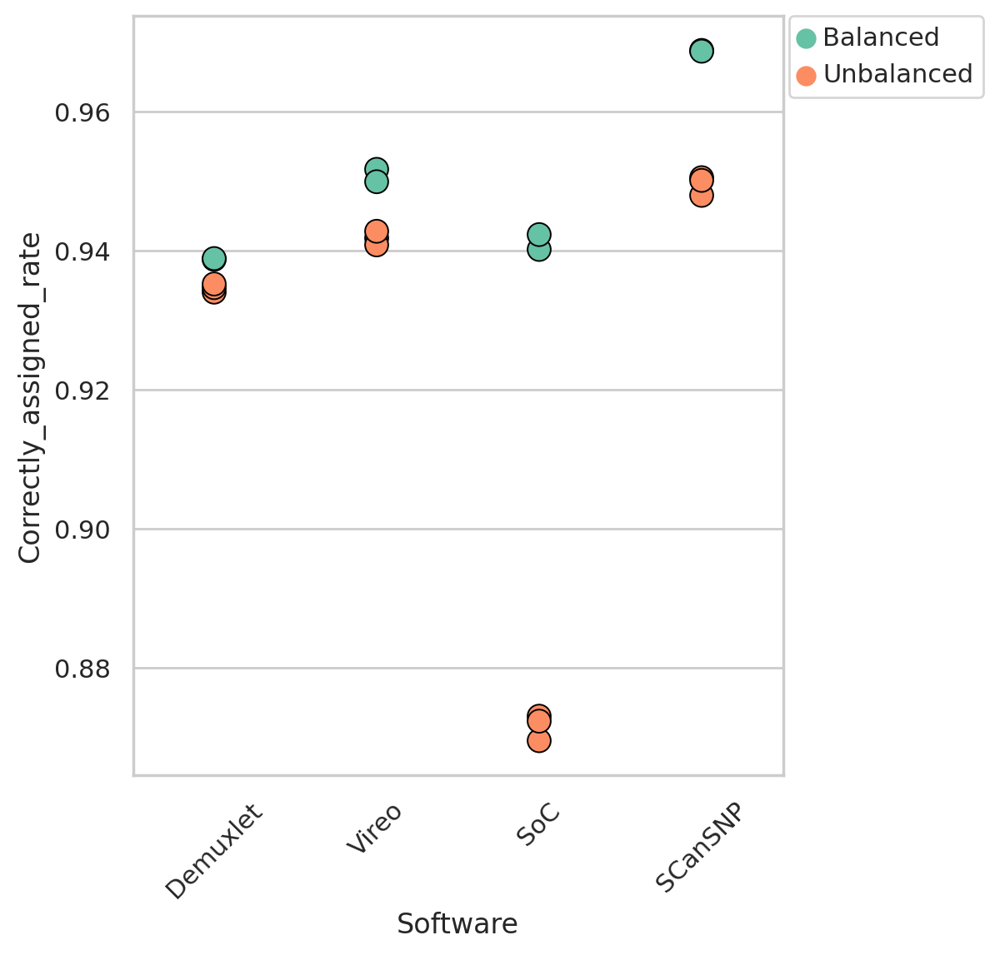

In [19]:
pylab.rcParams['figure.figsize'] = (5, 6)

sns.set_style("whitegrid")
g=sns.stripplot(x="Software", y="Correctly_assigned_rate", hue="SyntheticType",
                   data=SynthDFAccuracy, palette="Set2", size=10, jitter=0,edgecolor="black",linewidth=.7)
plt.xticks(rotation=45)
plt.legend(bbox_to_anchor=(1.01, 1), loc=2, borderaxespad=0.)

fig = g.get_figure()
fig.savefig(figDir+"/SynthAccuracy.svg",dpi=300, bbox_inches = "tight")



# Agreement rate

In [20]:
def jaccard_similarity(list1, list2):
    s1 = set(list1)
    s2 = set(list2)
    return float(len(s1.intersection(s2)) / len(s1.union(s2)))

JaccardDF = pd.DataFrame()
tmpDF = {}

for t in list(itertools.combinations(SoftwareList,2)):
    for ds in CombinedCallsDF.dataset.unique(): 
        localDF = CombinedCallsDF[CombinedCallsDF["dataset"] == ds]
        pd.crosstab(CombinedCallsDF.loc[CombinedCallsDF.Consensus != 'lowQuality','Consensus'],CombinedCallsDF.loc[CombinedCallsDF.Consensus != 'lowQuality','SoC'])
        SoCmapDF = localDF[(~localDF['Consensus'].isin(['Unassigned','LowQuality','doublet'])) & (~localDF['SoC'].isin(['Unassigned','LowQuality','doublet']))]
        localDF['SoC'] = localDF['SoC'].replace(pd.crosstab(SoCmapDF['Consensus'],SoCmapDF['SoC']).idxmax().to_dict())
        tmpDF[ds] = localDF.copy()
        #t = pd.crosstab(localDF.loc[localDF.Consensus != 'lowQuality','Consensus'],localDF.loc[localDF.Consensus != 'lowQuality','SoC'])
        for ID in pd.Series([i for i in localDF.to_numpy().flatten() if type(i) != int and type(i) != float ]).unique():
            l1 = localDF[localDF[t[0]] == ID].index.tolist()
            l2 = localDF[localDF[t[1]] == ID].index.tolist()
            
            if (len(l1) > 0) or (len(l2) >0):            
                JaccardDF_t = pd.DataFrame({"Jaccard_similarity":jaccard_similarity(l1, l2),"Software_pair":"_".join(t),"dataset":ds,"ID":ID}, index=[0])
                JaccardDF = pd.concat([JaccardDF,JaccardDF_t], ignore_index=True )

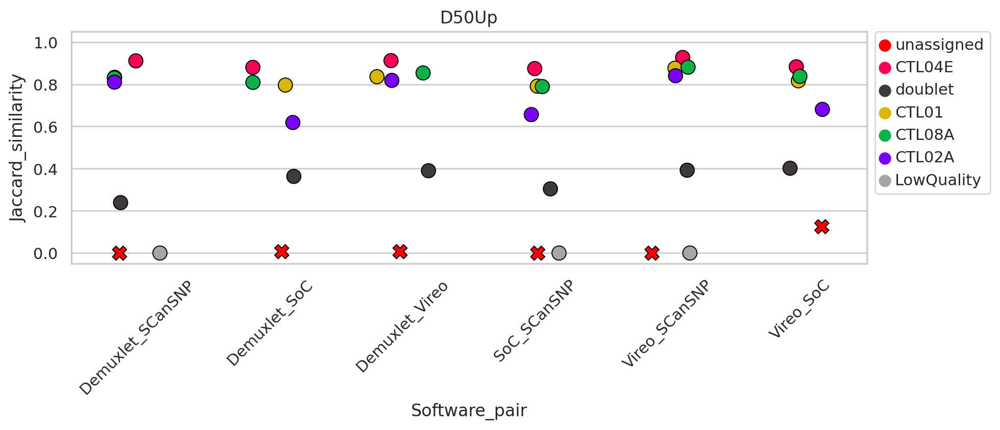

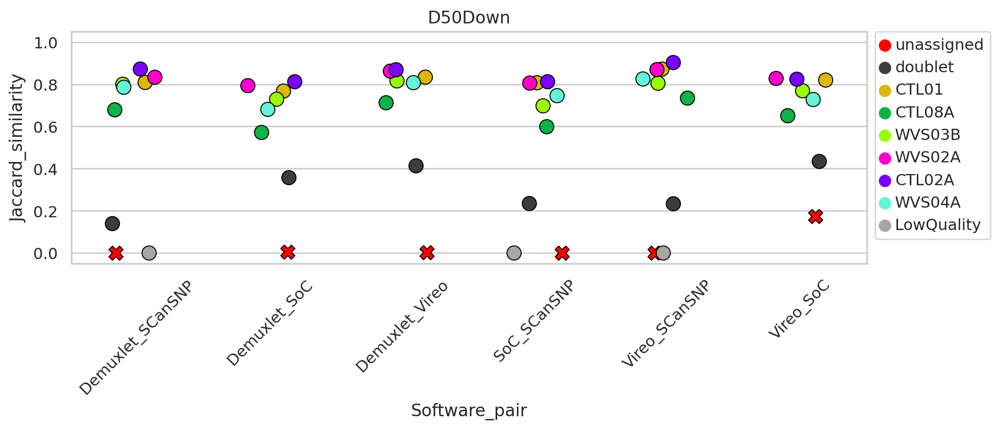

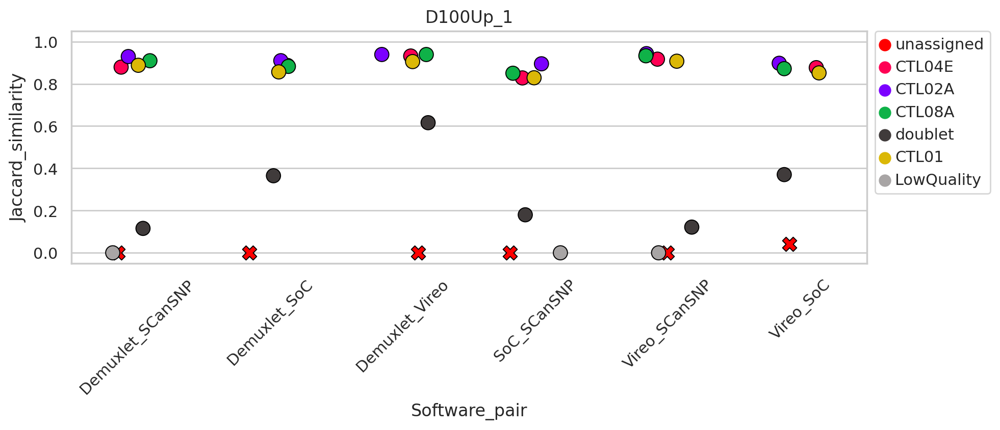

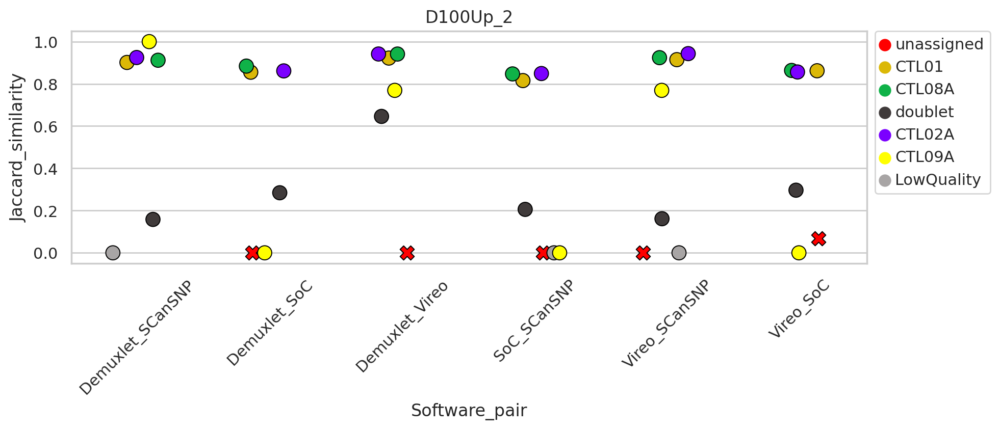

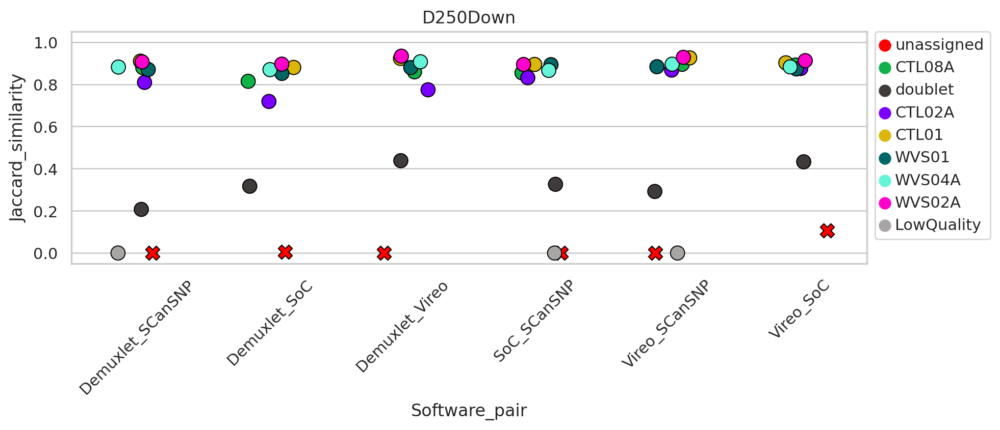

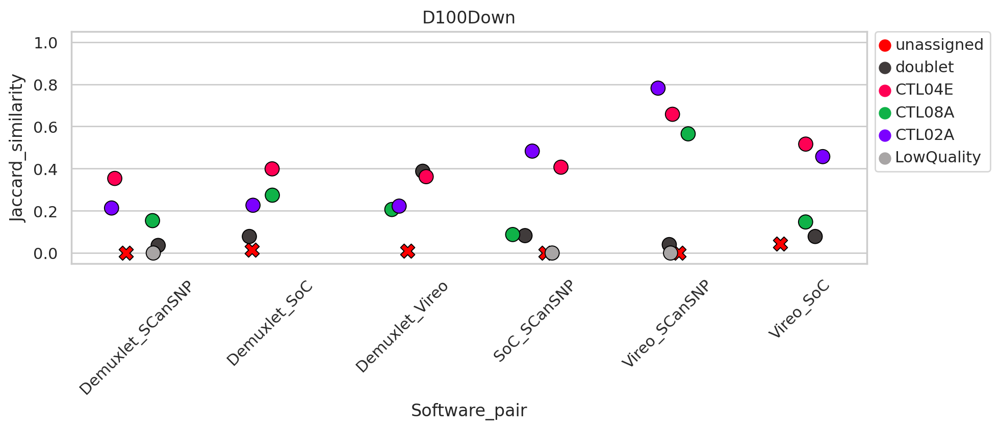

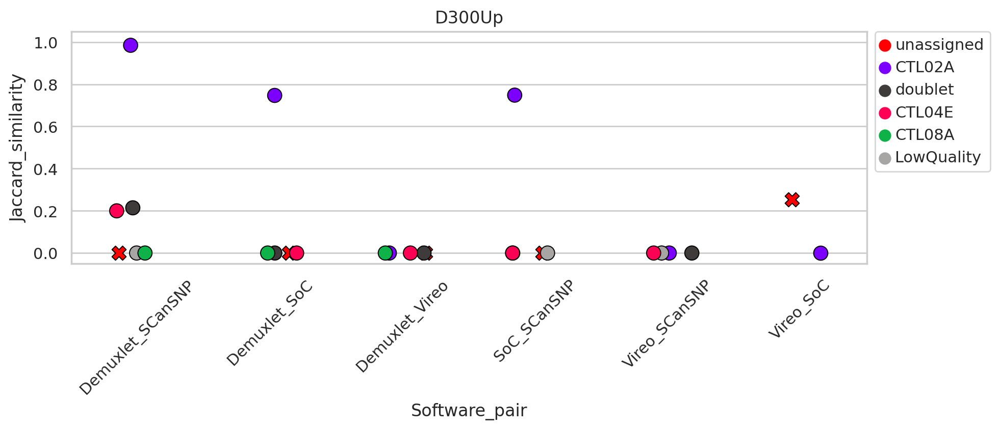

<Figure size 1000x300 with 0 Axes>

In [21]:
pylab.rcParams['figure.figsize'] = (10, 6)
JaccardDF["ID"] = JaccardDF.ID.replace({"Doublet":"doublet","Unassigned":"unassigned","Singlet":"singlet"})
pylab.rcParams['figure.figsize'] = (10, 3)
ColorMappings = {k: v for d in [{iPSC_lines_map[k]["newName"]:iPSC_lines_map[k]["color"]} for k in list(iPSC_lines_map.keys())] for k, v in d.items()}
ColorMappings["Overall_agreement"] = "#ff0000"


for ds in JaccardDF.dataset.unique():
    jaccardDF_local = JaccardDF[JaccardDF["dataset"] == ds]
    jaccardDF_local["Software_pair"] = jaccardDF_local["Software_pair"].astype("category")
    jaccardDF_localUnassigned = jaccardDF_local[jaccardDF_local.ID == "unassigned"]
    jaccardDF_local = jaccardDF_local[~jaccardDF_local.ID.isin(["unassigned"])]

    g =  sns.stripplot(x="Software_pair", y="Jaccard_similarity", hue="ID",data=jaccardDF_localUnassigned,palette=ColorMappings,marker = "X",
                  jitter=.2, edgecolor="black",linewidth=.7, size=10)

    g = sns.stripplot(x="Software_pair", y="Jaccard_similarity", hue="ID",data=jaccardDF_local,palette=ColorMappings,marker = "o",
                  jitter=.2, edgecolor="black",linewidth=.7, size=10)
    
    plt.title(ds)
    plt.ylim((-.05,1.05))
    
    plt.legend(bbox_to_anchor=(1.01, 1), loc=2, borderaxespad=0.)
    plt.xticks(rotation=45)

    plt.figure()
    
    fig = g.get_figure()
    fig.savefig(figDir+"/Agreement."+ds+".svg",dpi=300, bbox_inches = "tight")

# Sankey of singlets and doublets

In [22]:
SCanSNPCall = pd.DataFrame()
for ds in list(DatasetBasedirs.keys()):
    SCanSNPCall_noLq = pd.read_csv(DatasetBasedirs[ds]+"/scansnp/Cell_IDs.tsv", sep = "\t", index_col=0)[["ID"]].replace({"Doublet":"doublet"})
    SCanSNPCall_noLq.index = [i+"_"+ds for i in SCanSNPCall_noLq.index.tolist()]
    SCanSNPCall = pd.concat([SCanSNPCall, SCanSNPCall_noLq])
    
CombinedCallsSNG_DBL = CombinedCallsDF[SoftwareList+['Consensus']].copy()
CombinedCallsSNG_DBL['SCanSNP'] = SCanSNPCall.loc[CombinedCallsDF.index.tolist()]
CombinedCallsSNG_DBL['SCanSNP'] = CombinedCallsSNG_DBL['SCanSNP'].replace(Namesmap)

In [23]:
CombinedCallsSNG_DBL[~CombinedCallsSNG_DBL.isin(['Unassigned','doublet','LowQuality'])] = 'singlet'

In [24]:
CombinedCallsSNG_DBL['dataset'] = CombinedCallsDF.loc[CombinedCallsSNG_DBL.index,'dataset']

In [25]:
#cleanup

CombinedCallsSNG_DBL.groupby(['Demuxlet', 'Consensus','Vireo', 'SoC', 'SCanSNP'], as_index=False).size()

,Demuxlet,Consensus,Vireo,SoC,SCanSNP,size
0,Unassigned,LowQuality,Unassigned,Unassigned,singlet,3
1,Unassigned,LowQuality,Unassigned,doublet,singlet,1
2,Unassigned,LowQuality,Unassigned,singlet,singlet,12
3,Unassigned,LowQuality,doublet,Unassigned,singlet,3
4,Unassigned,LowQuality,doublet,singlet,singlet,10
...,...,...,...,...,...,...
91,singlet,singlet,doublet,singlet,singlet,774
92,singlet,singlet,singlet,Unassigned,singlet,743
93,singlet,singlet,singlet,doublet,singlet,526
94,singlet,singlet,singlet,singlet,doublet,298


# Sankey of singlets and doublets

In [26]:
SCanSNPCall = pd.DataFrame()
for ds in list(DatasetBasedirs.keys()):
    SCanSNPCall_noLq = pd.read_csv(DatasetBasedirs[ds]+"/scansnp/Cell_IDs.tsv", sep = "\t", index_col=0)[["ID"]].replace({"Doublet":"doublet"})
    SCanSNPCall_noLq.index = [i+"_"+ds for i in SCanSNPCall_noLq.index.tolist()]
    SCanSNPCall = pd.concat([SCanSNPCall, SCanSNPCall_noLq])
    
CombinedCallsSNG_DBL = CombinedCallsDF[SoftwareList+['Consensus']].copy()
CombinedCallsSNG_DBL['SCanSNP'] = SCanSNPCall.loc[CombinedCallsDF.index.tolist()]
CombinedCallsSNG_DBL['SCanSNP'] = CombinedCallsSNG_DBL['SCanSNP'].replace(Namesmap)

In [27]:
CombinedCallsSNG_DBL[~CombinedCallsSNG_DBL.isin(['Unassigned','doublet','LowQuality'])] = 'singlet'

In [28]:
CombinedCallsSNG_DBL['dataset'] = CombinedCallsDF.loc[CombinedCallsSNG_DBL.index,'dataset']

In [29]:
#cleanup

CombinedCallsSNG_DBL.groupby(['Demuxlet', 'Consensus','Vireo', 'SoC', 'SCanSNP'], as_index=False).size()

,Demuxlet,Consensus,Vireo,SoC,SCanSNP,size
0,Unassigned,LowQuality,Unassigned,Unassigned,singlet,3
1,Unassigned,LowQuality,Unassigned,doublet,singlet,1
2,Unassigned,LowQuality,Unassigned,singlet,singlet,12
3,Unassigned,LowQuality,doublet,Unassigned,singlet,3
4,Unassigned,LowQuality,doublet,singlet,singlet,10
...,...,...,...,...,...,...
91,singlet,singlet,doublet,singlet,singlet,774
92,singlet,singlet,singlet,Unassigned,singlet,743
93,singlet,singlet,singlet,doublet,singlet,526
94,singlet,singlet,singlet,singlet,doublet,298


In [30]:
CombinedCallsSNG_DBL = CombinedCallsDF[SoftwareList].copy()
CombinedCallsSNG_DBL[~CombinedCallsSNG_DBL.isin(['Unassigned','doublet','LowQuality'])] = 'singlet'
CombinedCallsSNG_DBL['SCnasnpQUAL']= np.where(CombinedCallsSNG_DBL.SCanSNP == 'LowQuality',1,0)
CombinedCallsSNG_DBL['SCnasnpQUAL']= np.where(CombinedCallsSNG_DBL.SCanSNP == 'doublet',.5,CombinedCallsSNG_DBL['SCnasnpQUAL'])

fig = px.parallel_categories(CombinedCallsSNG_DBL, 
                             dimensions=['Demuxlet','Vireo', 'SCanSNP','SoC'],color='SCnasnpQUAL',
                             color_continuous_scale=px.colors.sequential.Jet,
                             width=900,height=500)
fig.show()
fig.write_image(figDir+'/SankeyLowquality.svg')